## Исследование данных о  заведениях общественного питания Москвы

### Изучение Дата фрейма

Импортируем Библиотеки в проект

In [1]:
import pandas as pd
import json
import re
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

from folium.features import CustomIcon

Зададим параметры отображения столбцов.

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [3]:
try:
    df = pd.read_csv('D:/dataset/moscow_places.csv')
except:
    df = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Посмотрим общую информации по DataSet 

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Поверим сумму пропусков в значениях**

In [6]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Посчитаем явные дубликаты в таблице:

In [7]:
df.duplicated().sum()

0

**Добабим описание столбцов df**

- **name** — название заведения;
- **address** — адрес заведения;
- **category** — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- **hours** — информация о днях и часах работы;
- **lat** — широта географической точки, в которой находится заведение;
- **lng** — долгота географической точки, в которой находится заведение;
- **rating** — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- **price* — категория цен в заведении, например «средние», «ниже среднего», «выше среднего»;
- **avg_bill** — строка, которая хранит среднюю стоимость заказа в виде диапазона.
- **middle_avg_bill** — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
- **middle_coffee_cup** — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- **chain** — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- **district** — административный район, в котором находится заведение, например Центральный административный округ;
- **seats** — количество посадочных мест.

Просмотрели основную информацию по dataframe **"/datasets/moscow_places.csv"**

1. **Выводы:** 
    1. Размер датафрема 8406 строк. 
    2. Типы данных object, float, int.
    3. Выявлены пропуски в данных колонок : 'hours', 'price',  'avg_bill', 
        'middle_avg_bill', 'middle_coffee_cup',  'seats'.
       
2. **План работ по обработке данных:**
   1.Заполнить пропущенные данные либо медианными, либо нулевыми значениями там, где это возможно.
   2. 
 

## Предобработка данных

### Поиск дубликатов 

In [8]:
df['name'].unique()

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

In [9]:
df['name'].duplicated().sum()

2792

Для удобства обработки пропусков и дубликатов удалим пробелы и приведем столбец к нижнему регистру.

In [10]:
df['name']=df['name'].str.lower()
df['name']=df['name'].str.strip()

Проверим

In [11]:
df['name'].duplicated().sum()

2894

In [12]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Замечаний нет

In [13]:
df['address'].unique()

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

Для удобства обработки пропусков и дубликатов удалим пробелы и приведем столбец к нижнему регистру.

In [14]:
df['address']=df['address'].str.lower()
df['address']=df['address'].str.strip()

Проверим дубликаты в дата фрейме по двум основным столбцам 'name', 'address'

In [15]:
df.duplicated(['name', 'address']).sum()

4

In [16]:
df.drop_duplicates(subset=['name', 'address'],keep=False, inplace=True)

Удалим дубликаты

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8398 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8398 non-null   object 
 1   category           8398 non-null   object 
 2   address            8398 non-null   object 
 3   district           8398 non-null   object 
 4   hours              7863 non-null   object 
 5   lat                8398 non-null   float64
 6   lng                8398 non-null   float64
 7   rating             8398 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8398 non-null   int64  
 13  seats              4789 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.1+ KB


Рассотрим уникальные значения в столбце 'hours'

In [18]:
df['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

Анамолий не выявлено.

Рассотрим уникальные значения в столбце 'rating'

In [19]:
df['rating'].sort_values().unique()

array([1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2,
       2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5,
       3.6, 3.7, 3.8, 3.9, 4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8,
       4.9, 5. ])

<AxesSubplot:xlabel='rating'>

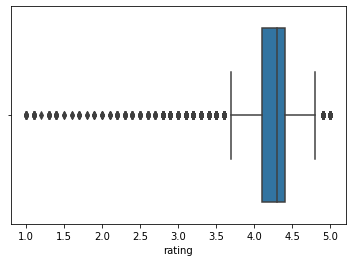

In [20]:
sns.boxplot(x="rating",data=df)

In [21]:
len(df.query('rating<=3.5'))

504

Выявлены 504 заведения с анамально низким рейтингом. Зафиксируем данный факт. 

Рассотрим уникальные значения в столбце 'price'

In [22]:
df['price'].sort_values().unique()

array(['высокие', 'выше среднего', 'низкие', 'средние', nan], dtype=object)

Анамолий не выявлено. Nan заполним на дальнейших этапах используя столбец avg_bill

Рассотрим уникальные значения в столбце 'avg_bill'

In [23]:
df['avg_bill'].sort_values().unique()

array(['Средний счёт:100 ₽', 'Средний счёт:1000 ₽',
       'Средний счёт:1000–10000 ₽', 'Средний счёт:1000–1100 ₽',
       'Средний счёт:1000–1200 ₽', 'Средний счёт:1000–1300 ₽',
       'Средний счёт:1000–1350 ₽', 'Средний счёт:1000–1400 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1000–1600 ₽',
       'Средний счёт:1000–1700 ₽', 'Средний счёт:1000–2000 ₽',
       'Средний счёт:1000–2500 ₽', 'Средний счёт:1000–3000 ₽',
       'Средний счёт:1000–5000 ₽', 'Средний счёт:100–1000 ₽',
       'Средний счёт:100–160 ₽', 'Средний счёт:100–180 ₽',
       'Средний счёт:100–200 ₽', 'Средний счёт:100–2000 ₽',
       'Средний счёт:100–270 ₽', 'Средний счёт:100–300 ₽',
       'Средний счёт:100–330 ₽', 'Средний счёт:100–350 ₽',
       'Средний счёт:100–400 ₽', 'Средний счёт:100–423 ₽',
       'Средний счёт:100–500 ₽', 'Средний счёт:100–599 ₽',
       'Средний счёт:100–700 ₽', 'Средний счёт:1100–1500 ₽',
       'Средний счёт:110–200 ₽', 'Средний счёт:120 ₽',
       'Средний счёт:1200 ₽', 'Средн

Данные разношерстые. Данные оставим  как есть . Добавим столбец с средней ценой пива 'middle_glass_beer' по примеру 'middle_avg_bill'

In [24]:
def spliter_bear (s):
    try:
        s_str = s.replace('от', '')
        splited=re.split(r':|–|₽|:от',s_str)
        if  "пива" in  splited[0]:

            if len(splited)==4:
                
                return (float(splited[2]) + float(splited[1]))/2

            elif len(splited)==3:
                

                return float(splited[1])
    except:
        pass

In [25]:
df["middle_glass_beer"]=df['avg_bill'].apply(spliter_bear)


Рассотрим уникальные значения в столбце 'middle_glass_bear'

<AxesSubplot:xlabel='middle_glass_beer'>

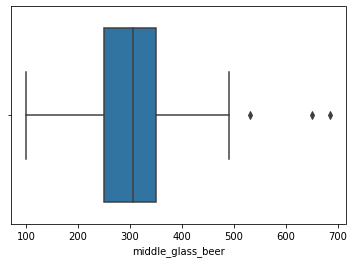

In [26]:
sns.boxplot(x="middle_glass_beer",data=df)

In [27]:
len(df.query('middle_glass_beer>600'))

2

 Найдено 2 аномальных значения удали их 

In [28]:
df=df.loc[(df['middle_glass_beer']<600) | (df['middle_glass_beer'].isnull())]

Рассотрим уникальные значения в столбце 'middle_avg_bill'

In [29]:
df['middle_avg_bill'].sort_values().unique()

array([0.000e+00, 3.000e+01, 5.000e+01, 6.700e+01, 9.000e+01, 1.000e+02,
       1.070e+02, 1.100e+02, 1.200e+02, 1.250e+02, 1.300e+02, 1.350e+02,
       1.400e+02, 1.410e+02, 1.500e+02, 1.550e+02, 1.600e+02, 1.650e+02,
       1.670e+02, 1.700e+02, 1.750e+02, 1.800e+02, 1.850e+02, 1.900e+02,
       1.950e+02, 1.990e+02, 2.000e+02, 2.050e+02, 2.090e+02, 2.100e+02,
       2.150e+02, 2.200e+02, 2.250e+02, 2.290e+02, 2.300e+02, 2.350e+02,
       2.400e+02, 2.450e+02, 2.500e+02, 2.550e+02, 2.600e+02, 2.610e+02,
       2.650e+02, 2.660e+02, 2.690e+02, 2.700e+02, 2.750e+02, 2.800e+02,
       2.840e+02, 2.850e+02, 2.900e+02, 2.910e+02, 2.950e+02, 2.980e+02,
       2.990e+02, 3.000e+02, 3.010e+02, 3.040e+02, 3.050e+02, 3.090e+02,
       3.100e+02, 3.130e+02, 3.150e+02, 3.170e+02, 3.200e+02, 3.210e+02,
       3.240e+02, 3.250e+02, 3.280e+02, 3.300e+02, 3.350e+02, 3.390e+02,
       3.400e+02, 3.430e+02, 3.440e+02, 3.450e+02, 3.490e+02, 3.500e+02,
       3.520e+02, 3.550e+02, 3.600e+02, 3.620e+02, 

<AxesSubplot:xlabel='middle_avg_bill'>

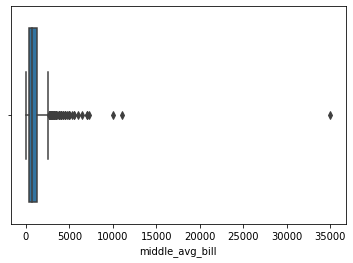

In [30]:
sns.boxplot(x="middle_avg_bill",data=df)

In [31]:
len(df.query('middle_avg_bill==0'))

1

In [32]:
len(df.query('middle_avg_bill>5000'))

11

Средний счет не может быть равен 0. Удалим это значение. Так  же удалим удалим аномально большие значения. 

In [33]:
df=df.loc[df['middle_avg_bill']!=0]
df=df.loc[(df['middle_avg_bill']<5000) | (df['middle_avg_bill'].isnull())]

Анамолий не выявлено. Nan заполним на дальнейших этапах использую столбец avg_bill

Рассотрим уникальные значения в столбце 'middle_coffee_cup'

In [34]:
df['middle_coffee_cup'].sort_values().unique()

array([  60.,   75.,   79.,   80.,   84.,   89.,   90.,   94.,   95.,
        100.,  102.,  105.,  110.,  112.,  115.,  119.,  120.,  124.,
        125.,  127.,  129.,  130.,  134.,  135.,  137.,  138.,  139.,
        140.,  144.,  145.,  149.,  150.,  154.,  155.,  159.,  160.,
        162.,  164.,  165.,  167.,  169.,  170.,  172.,  174.,  175.,
        179.,  180.,  184.,  185.,  189.,  190.,  195.,  197.,  199.,
        200.,  204.,  205.,  210.,  214.,  215.,  217.,  220.,  225.,
        227.,  229.,  230.,  235.,  237.,  240.,  242.,  245.,  246.,
        250.,  254.,  255.,  256.,  259.,  260.,  265.,  266.,  270.,
        275.,  279.,  285.,  287.,  290.,  291.,  295.,  297.,  300.,
        315.,  320.,  325.,  328.,  375., 1568.,   nan])

In [35]:
len(df.query('middle_coffee_cup>400'))

1

<AxesSubplot:xlabel='middle_coffee_cup'>

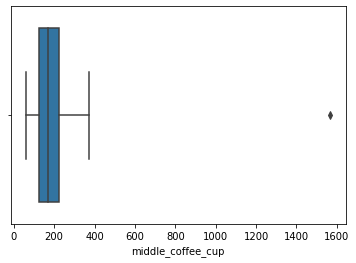

In [36]:
sns.boxplot(x="middle_coffee_cup",data=df)

In [37]:
len(df.query('middle_coffee_cup>400'))

1

Выявили аномальную среднию цену, удалим ее.

In [38]:
df=df.loc[(df['middle_coffee_cup']<400) | (df['middle_coffee_cup'].isnull())]

Анамолий не выявлено. Nan заполним на дальнейших этапах использую столбец avg_bill

Рассотрим уникальные значения в столбце 'chain'

In [39]:
df['chain'].sort_values().unique()

array([0, 1])

Анамалий не выявлено

Рассотрим уникальные значения в столбце 'seats'

In [40]:
df['seats'].sort_values().unique()

array([0.000e+00, 1.000e+00, 2.000e+00, 3.000e+00, 4.000e+00, 5.000e+00,
       6.000e+00, 7.000e+00, 8.000e+00, 9.000e+00, 1.000e+01, 1.200e+01,
       1.300e+01, 1.400e+01, 1.500e+01, 1.600e+01, 1.700e+01, 1.800e+01,
       1.900e+01, 2.000e+01, 2.100e+01, 2.200e+01, 2.400e+01, 2.500e+01,
       2.600e+01, 2.700e+01, 2.800e+01, 2.900e+01, 3.000e+01, 3.200e+01,
       3.300e+01, 3.400e+01, 3.500e+01, 3.600e+01, 3.700e+01, 3.800e+01,
       3.900e+01, 4.000e+01, 4.100e+01, 4.200e+01, 4.300e+01, 4.400e+01,
       4.500e+01, 4.600e+01, 4.700e+01, 4.800e+01, 4.900e+01, 5.000e+01,
       5.100e+01, 5.200e+01, 5.300e+01, 5.400e+01, 5.500e+01, 5.600e+01,
       5.800e+01, 6.000e+01, 6.100e+01, 6.200e+01, 6.300e+01, 6.400e+01,
       6.500e+01, 6.600e+01, 6.700e+01, 6.800e+01, 6.900e+01, 7.000e+01,
       7.200e+01, 7.400e+01, 7.500e+01, 7.600e+01, 7.700e+01, 7.800e+01,
       7.900e+01, 8.000e+01, 8.100e+01, 8.200e+01, 8.300e+01, 8.400e+01,
       8.500e+01, 8.600e+01, 8.700e+01, 8.800e+01, 

<AxesSubplot:xlabel='seats'>

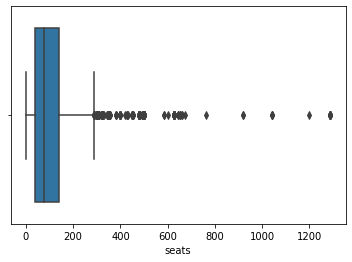

In [41]:
sns.boxplot(x="seats",data=df)

In [42]:
len(df.query('seats>500'))

56

In [43]:
len(df.query('seats==0'))

136

Выявлены заведения с аномальным количеством посадочных мест . Удалим заведения с количеством посадочных мест большем 500. Заведения с количеством посадочных мест равно 0. Оставим возможно они работают только на доставку.

In [44]:
df=df.loc[(df['seats']<500) | (df['seats'].isnull())]

Заполним пропуски в столбце 'middle_coffee_cup' и middle_avg_bill по 'avg_bill'

In [46]:
def spliter_cup(s):
    try:
        s_str = s.replace('от', '')
        splited = re.split(r':|–|₽|:от', s_str)

        if "чашки" in splited[0]:

           
            if len(splited) == 4:

                return (float(splited[2]) + float(splited[1])) / 2

            elif len(splited) == 3:

                return float(splited[1])
    except:
        pass

In [47]:
df['middle_coffee_cup']=df['middle_coffee_cup'].where(~df['middle_coffee_cup'].isna(),df['avg_bill'].apply(spliter_cup))

In [48]:
def spliter_bill(s):
    try:
        s_str = s.replace('от', '')
        splited = re.split(r':|–|₽|:от', s_str)

        if "счёт" in splited[0]:

           
            if len(splited) == 4:

                return (float(splited[2]) + float(splited[1])) / 2

            elif len(splited) == 3:

                return float(splited[1])
    except:
        pass

In [49]:
df['middle_avg_bill']=df['middle_avg_bill'].where(~df['middle_avg_bill'].isna(),df['avg_bill'].apply(spliter_bill))

In [50]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,middle_glass_beer
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,NaN
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,NaN
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,NaN


Обработка пропускров в таблице price	Для этого нам необходимо создать с категориальные  столбцы для middle_avg_bill , middle_coffee_cup, middle_glass_beer


In [51]:
def get_coffe(price):
   
        if price < 125:
            return 'низкие'
        elif 125 <= price < 175:   
            return 'средние'
        elif 175 <= price < 225:
            return 'выше среднего'
        elif  225 <= price:
            return 'высокие'

def get_middle_avg(price):
    if price < 500:
        return 'низкие'

    elif 500 <= price < 1000:
        return 'средние'
    elif 1000 <= price < 1225:
       return 'выше среднего'
    elif 1225 <= price:
        return 'высокие'
      
    
def get_beer(price):
    if price < 250:
        return 'низкие'
    elif 250 <= price < 315:
        return 'средние'
    elif 315 <= price < 375:
        return 'выше среднего'
    elif 375 <= price:
        return 'высокие'

In [52]:



df['price']=df['price'].where(~df['price'].isna(),df['middle_avg_bill'].apply(get_middle_avg))
df['price']=df['price'].where(~df['price'].isna(),df['middle_coffee_cup'].apply(get_coffe))
df['price']=df['price'].where(~df['price'].isna(),df['middle_avg_bill'].apply(get_beer))


### Создание таблиц

Создадим столбец street с названиями улиц из столбца с адресом

In [54]:
def spliter_street(line):
    try:
        splited = re.split(r',',line)
        return splited[1]
    except:
        pass


In [55]:
df['street']=df['address'].apply(spliter_street)

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

In [56]:
def work_time(line):
    try:
        splited = re.split(r',',line)
        if ('ежедневно' in splited[0]) & ('круглосуточно' in splited[1]):

            return True
        else:
            return False
    except:
        pass

In [57]:
df['is_24/7']=df['hours'].apply(work_time)

In [140]:
df['is_24/7']=df['is_24/7'].fillna(False)

In [60]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 527
lat                     0
lng                     0
rating                  0
price                4319
avg_bill             4544
middle_avg_bill      5202
middle_coffee_cup    7772
chain                   0
seats                3603
middle_glass_beer    8172
street                  0
is_24/7              1718
dtype: int64

In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8300 entries, 0 to 8405
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8300 non-null   object 
 1   category           8300 non-null   object 
 2   address            8300 non-null   object 
 3   district           8300 non-null   object 
 4   hours              7773 non-null   object 
 5   lat                8300 non-null   float64
 6   lng                8300 non-null   float64
 7   rating             8300 non-null   float64
 8   price              3981 non-null   object 
 9   avg_bill           3756 non-null   object 
 10  middle_avg_bill    3098 non-null   float64
 11  middle_coffee_cup  528 non-null    float64
 12  chain              8300 non-null   int64  
 13  seats              4697 non-null   float64
 14  middle_glass_beer  128 non-null    float64
 15  street             8300 non-null   object 
 16  is_24/7            6582 

Выполнилт предобработку данных
    **Выводы :**
- Явных дубликатов не выявлено.
- Создали 3 новых столбца  is_24/7,  middle_glass_beer, street
- Частично заполнили пропуски в столбце price
- Удалили аномальные значения в количестве 106 значений
- Выявлено 504 заведения с анамально низким рейтингом. 

## Анализ данных

Исследуйем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары 

In [62]:
pivot_table_type=pd.pivot_table(df,index='category', values=['name' ] ,aggfunc=[ 'count'])

In [63]:
pivot_table_type.columns=['count']

In [185]:
fig = px.bar(pivot_table_type.sort_values(by='count', ascending=False))

fig.update_layout(title='График популярности заведения в зависимости от категории заведения',
                   xaxis_title='Категория',
                   yaxis_title='Количество заведений',
                  legend=None,
                  width=800, 
                  height=500)
fig.show() 

**Выводы:**  К самым распространённым заведениям относятся заведения из категории кафе, ресторан, кофейне.
     менее распространённые заведения это столовые, булочные.


Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 


In [65]:
pivot_table_type_seats=pd.pivot_table(df,index='category', values=['seats' ] ,aggfunc=['sum'])

In [66]:
pivot_table_type_seats.columns=['quantity_seats']

In [186]:
fig = px.bar(pivot_table_type_seats.sort_values(by='quantity_seats', ascending=False))
fig.update_layout(title='График количества посадочных мест в звависимости от категории заведения',
                   xaxis_title='Категория',
                   yaxis_title='Количество посадочных мест',
                  width=800, 
                  height=500)
fig.show()

**Выводы:** 
- Наибольшие количество посадочных мест в заведения категории ресторан, кафе, кофейня, наименьшее столовые и булочные.

Рассмотрим  соотношение сетевых к не сетевым заведениям в датасете. 

In [68]:
x='Обычное заведение'
y='Сетевое заведение'
def change_chaine(chain):
    if chain == 0:
        return x
    elif chain == 1:
        return y



In [69]:
df['chain']=df['chain'].apply(change_chaine)

In [70]:
pivot_table_chain=pd.pivot_table(df,index='chain', values=['name' ] ,aggfunc=['count'])

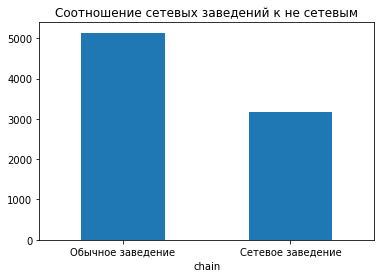

In [72]:
pivot_table_chain.plot.bar(stacked=True,title="Соотношение сетевых заведений к не сетевым",rot=0, legend=None);

**Выводы:** 
Сетевые заведения составляют  38 процентов от всех заведение , не сетевых заведений значительно больше 62 процента от общего числа

Рассмотрим количество посадочных мест в зависимости от категории заведения 

In [73]:
data_ed = df.groupby(['chain', 'category'], \
                        as_index = False)[['seats']].count()

In [74]:
data_ed.sort_values(by=['chain','seats'],  ascending=False)

,chain,category,seats
14,Сетевое заведение,ресторан,451
11,Сетевое заведение,кафе,420
12,Сетевое заведение,кофейня,398
13,Сетевое заведение,пиццерия,246
10,Сетевое заведение,быстрое питание,129
8,Сетевое заведение,"бар,паб",109
9,Сетевое заведение,булочная,91
15,Сетевое заведение,столовая,43
6,Обычное заведение,ресторан,783
3,Обычное заведение,кафе,775


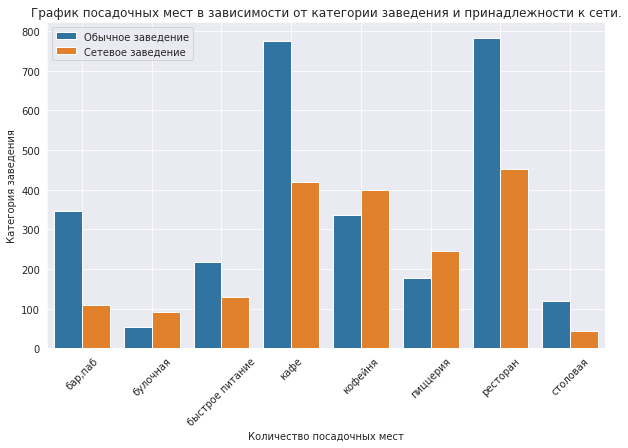

In [75]:
sns.set_style('dark')
plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='seats', data=data_ed, hue='chain')
plt.title('График посадочных мест в зависимости от категории заведения и принадлежности к сети.')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.xticks(rotation=45)
plt.legend()
plt.grid()
plt.show()

**Вывод:** Распределения по категориям заведения показывает то что в сетях и в обычных заведения самые распространёнными являются ресторан и кафе, но 3 место по количеству в сетях занимают кофейни так как в обычных заведениях это бары и пабы. В сетях не популярны пабы а в обычных заведениях реже можно встретить пиццерии .

Найдем 15 самых популярных сетей в городе Москва.

In [77]:
df_name= df.groupby(['name','chain'], as_index = False)[['street']].count()

In [78]:
df_name.columns=['name','chain','count']

In [79]:
df_name=df_name.loc[df_name['chain']=='Сетевое заведение']

In [80]:
df_name.sort_values(by='count', ascending=False)

,name,chain,count
5396,шоколадница,Сетевое заведение,117
2520,домино'с пицца,Сетевое заведение,76
2488,додо пицца,Сетевое заведение,74
1128,one price coffee,Сетевое заведение,70
5469,яндекс лавка,Сетевое заведение,68
411,cofix,Сетевое заведение,65
1255,prime,Сетевое заведение,50
4970,хинкальная,Сетевое заведение,44
3165,кофепорт,Сетевое заведение,42
3223,кулинарная лавка братьев караваевых,Сетевое заведение,38


In [81]:
df_name=df_name.loc[df_name['count']>=27]

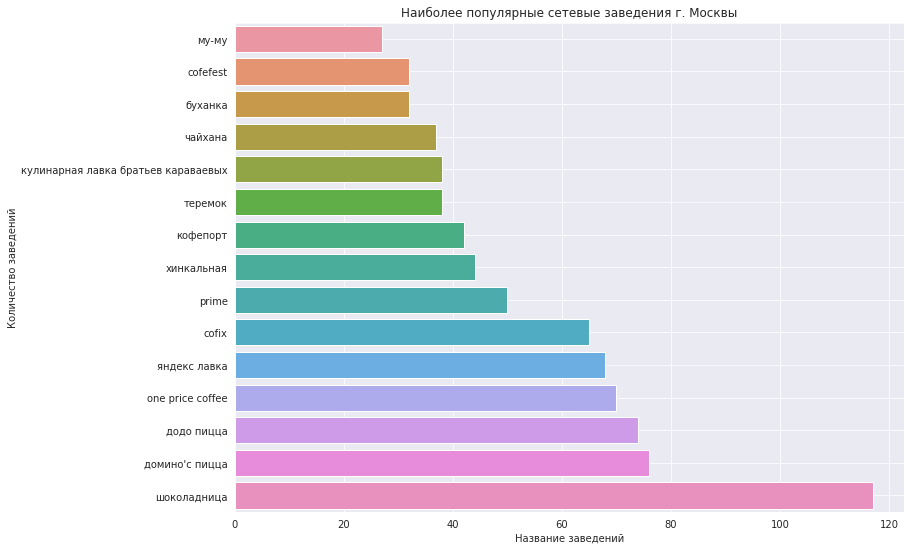

In [82]:
sns.set_style('dark')
plt.figure(figsize=(12,9))
sns.barplot(x='count', y='name', data=df_name.sort_values(by='count'))
plt.title('Наиболее популярные сетевые заведения г. Москвы')
plt.xlabel('Название заведений')
plt.ylabel('Количество заведений')
plt.xticks(rotation=0)
plt.legend('',frameon=False)
plt.grid()
plt.show()

**Выводы:** 
Самыми популярными сетями являются Шоколадница, Доминос пицца, Додо пицца, one price coffee, Яндекс лавка. Можно так же сделать вывод что популярные сети заняли такие ниши как кофейни плюс пиццерии. Малому бизнесу будет очень сложно конкурировать в данных сегментах. 

Отобразим общее количество заведений и количество заведений каждой категории по районам.

In [83]:
pivot_table_district=pd.pivot_table(df,index='district', values=['name' ] ,aggfunc=['count'])

In [84]:
pivot_table_district.columns=['count']

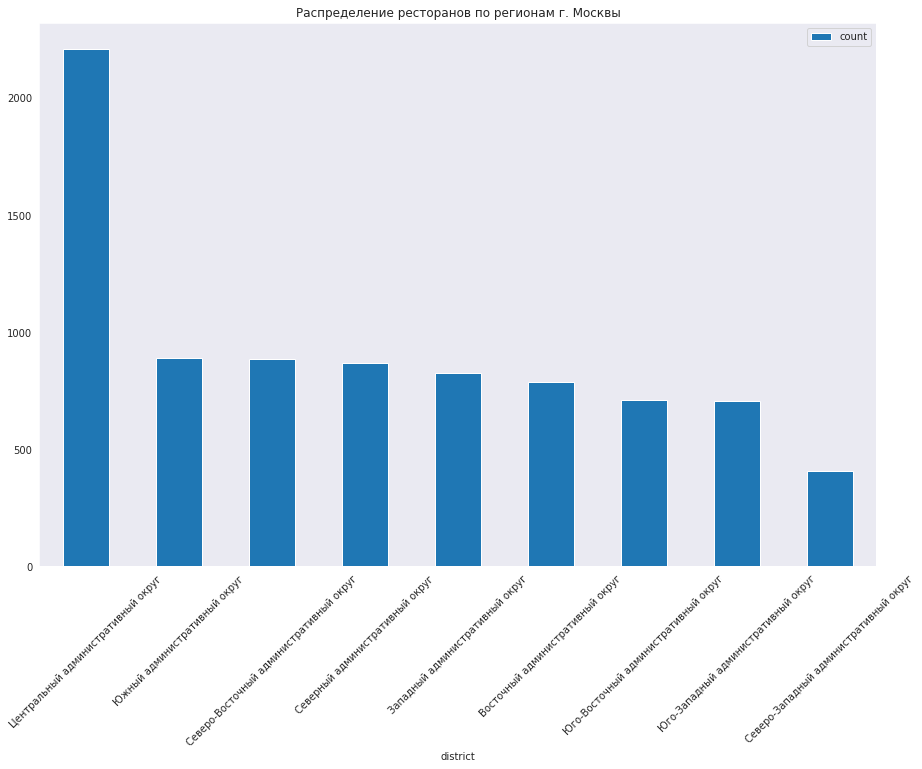

In [85]:
pivot_table_district.sort_values(by='count', ascending=False).plot.bar(figsize=(15, 10),stacked=True,title="Распределение ресторанов по регионам г. Москвы",rot=45);

In [86]:
df_district= df.groupby(['district','category'], as_index = False)[['name']].count()

In [87]:
df_district.columns=['district','category','count']

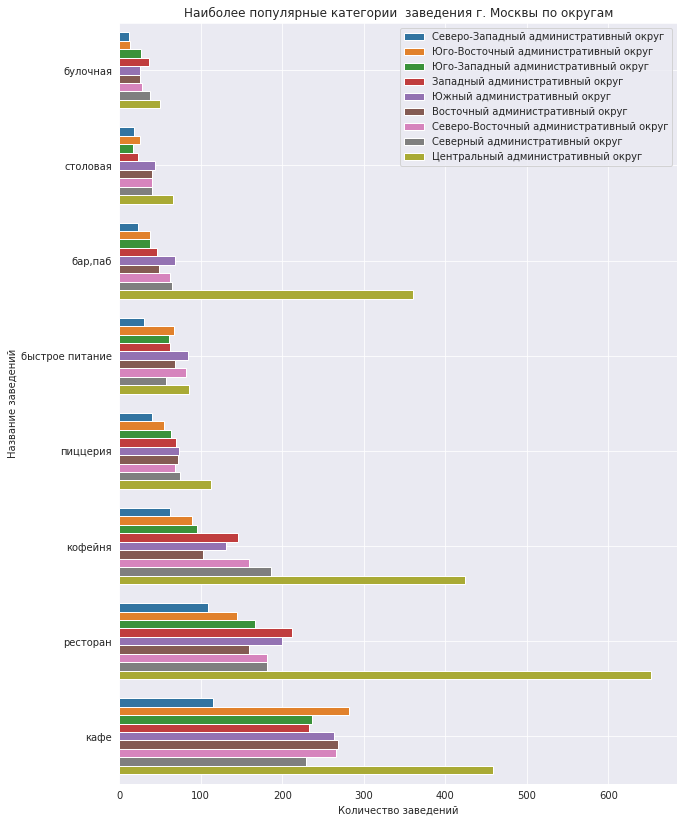

In [88]:
sns.set_style('dark')
plt.figure(figsize=(10,14))
sns.barplot(x='count', y='category', data=df_district.sort_values(by='count'), hue='district')
plt.title('Наиболее популярные категории  заведения г. Москвы по округам')
plt.xlabel('Количество заведений')
plt.ylabel('Название заведений')
plt.xticks(rotation=0)
plt.legend()
plt.grid()
plt.show()

**Выводы:** 
Распределение ресторанов по регионам г. Москвы
Самый насыщенный заведениями район это центральный в нем преобладают рестораны, кафе, кофейни, бары и пабы. Данное распределение является нормальным. Остальные районы Москвы не сильно отличаются друг от руга по количеству заведений не считая трех явных аутсайдера Северо-западный, Юго-западный, Юго-восточный административный округ. Сети быстрого питания и пиццерии и кафе распределены равномерно по Москве(не считаная северо-западного административного округа) . Пабы, бары, рестораны, кофейни в основной свое части расположены в центральном административном округе. 


Визуализируйем распределение средних рейтингов по категориям заведений. 


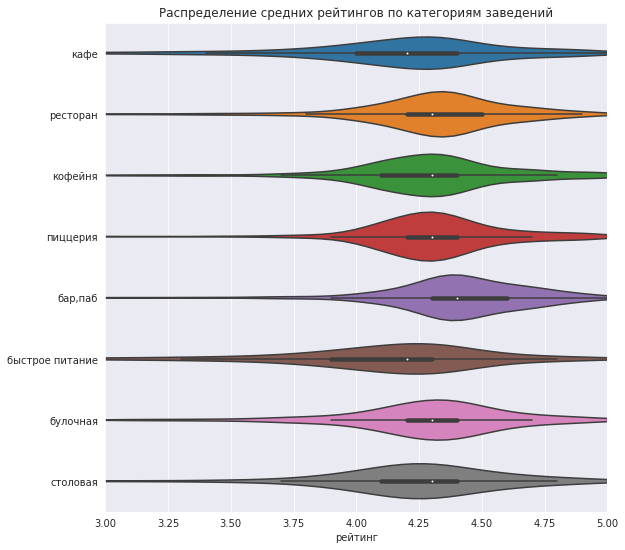

In [89]:
sns.set_style('darkgrid')
plt.figure(figsize=(9,9))
# строим график violinplot средствами seaborn
sns.violinplot(x='rating', y='category', data=df)
plt.xlim(3, 5)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('рейтинг')
plt.ylabel(None)
# отображаем график на экране
plt.show()

**Выводы:** 
Пабы, бары и рестораны явно выделяются в сторону более высоких средних рейтингов в то время как сети быстрого питания на против демонстрируют более низкое распределения средних рейтингов.

Построим фоновую картограмму  со средним рейтингом заведений каждого района.

In [90]:
df_group_rating = df.groupby('district', as_index=False)['rating'].agg('median')

In [92]:

moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=df_group_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам г. Москвы',
).add_to(m)
m

Отобразим  все заведения датасета на карте Москвы.


In [93]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    icon_url = 'https://e7.pngegg.com/pngimages/322/970/png-clipart-cafe-restaurant-hotel-computer-icons-dinner-fork-food-text.png'  
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker([row['lat'], row['lng']],popup=f"{row['name']} {row['rating']}",icon=icon,
    ).add_to(marker_cluster)
df.apply(create_clusters, axis=1)
m

Найдем топ-15 улиц по количеству заведений на данных улицах. 

In [94]:
street_15=df.groupby(['street'], as_index = False)[['name']].count()

In [95]:
street_15.columns=['street','count']

In [96]:
street_15.sort_values(by='count',ascending=False).head(15)

,street,count
835,проспект мира,182
839,профсоюзная улица,122
531,ленинский проспект,107
832,проспект вернадского,97
377,дмитровское шоссе,87
303,варшавское шоссе,76
459,каширское шоссе,76
529,ленинградский проспект,72
530,ленинградское шоссе,69
608,мкад,65


In [97]:
street_15=street_15.loc[street_15['count']>=47]

In [98]:
df_street= df.groupby(['street','category'], as_index = False)[['name']].count()

In [99]:
df_street=df_street.loc[df_street['street'].isin(list(street_15 ['street']))]

In [100]:
df_street.columns=['street','category','count']

In [101]:
#df_street=df_street.loc[df_street['count']>=23]

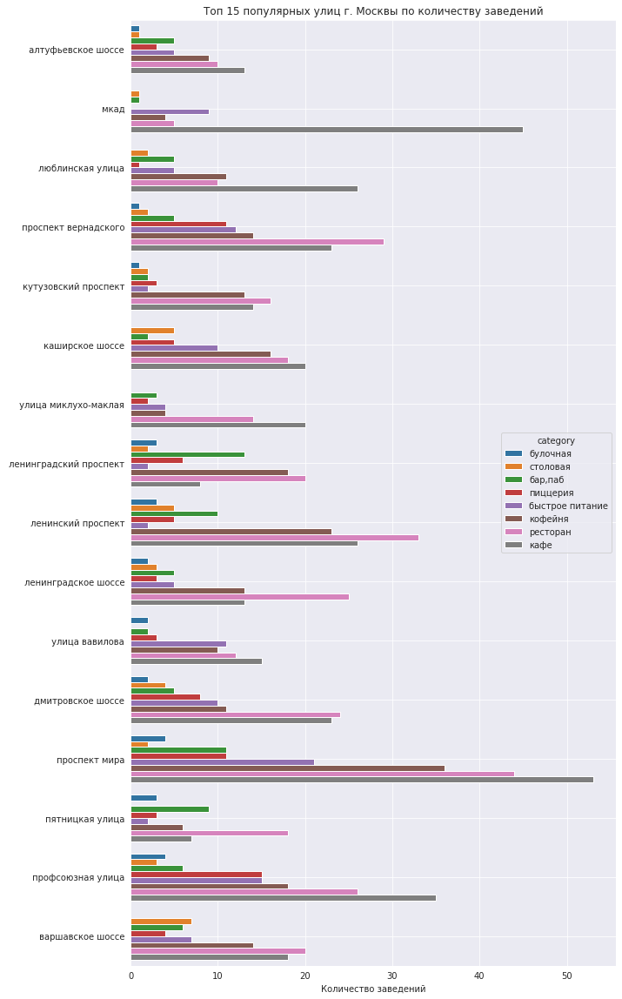

In [187]:
sns.set_style('dark')
plt.figure(figsize=(10,20))
sns.barplot(x='count', y='street', data=df_street.sort_values(by='count'),hue='category')
plt.title('Топ 15 популярных улиц г. Москвы по количеству заведений')
plt.xlabel('Количество заведений')
plt.ylabel(None)
plt.xticks(rotation=0)

plt.grid()
plt.show()

**Вывод:** 
- Наиболее популярные улицы в городе Москва по количеству заведений это
    - Проспект мира (больше распространение получили рестораны)
    - Профсоюзная улица (больше распространение получили Кафе)
    - Ленинский проспект (больше распространение получили Кафе)
- В данной выборки выделяется Мкад наличием большого количества кафе.


Найдем улицы, на которых находится только один объект общепита.

In [103]:
street_1=df.groupby(['street'], as_index = False)[['name']].count()

In [104]:
street_1.columns=['street','count']

In [105]:
street_1=street_1.loc[street_1['count']==1]

In [106]:
len(list(street_1['street']))

457

In [107]:
street_1['street']

0                                                   1-й автозаводский проезд
1                                                    1-й балтийский переулок
2                                                      1-й варшавский проезд
3                                                    1-й вешняковский проезд
5                                                  1-й голутвинский переулок
6                                                 1-й грайвороновский проезд
7                                                  1-й дербеневский переулок
9                                                     1-й земельный переулок
10                                                   1-й капотнинский проезд
11                                                    1-й кирпичный переулок
12                                                  1-й колобовский переулок
13                                                 1-й котляковский переулок
15                                                   1-й курьяновский проезд

**Выводы:** Найдено 457 улиц  на которых находится только один объект общепита. 

Рассчитаем медиальную цену чека в заведениях г. Москвы по районам.

In [108]:
df_group_district = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

In [109]:
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=df_group_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Медианная цена чека в заведениях  г. Москвы по районам',
).add_to(m)
m

**Выводы:**  Западный административный округ и Центральный административный округ показывают наибольший результат. Полученный результат является ожидаемым так как центр всегда является более востребован в сфере общепита а западный район Г. Москвы считается более востребованным при выборе места жительства (Лучшая Экология) цена на еду в ресторанах подтверждает данный тренд. Медианный чек в  Южных и Северные районах г. Москвы является более дешёвым относительно  Западного и Центрального административного округа.

Исследуйем часы работы заведений и их зависимость от расположения и категории заведения

In [110]:
df_time=df.groupby(['district','is_24/7'], as_index = False)[['name']].count()

In [111]:
df_time_24=df_time.loc[df_time['is_24/7']==True]

In [112]:
df_time_24.columns=['district','is_24/7','count_24/7']

In [113]:
df_time_normal=df_time.loc[df_time['is_24/7']==False]
df_time_normal.columns=['district','is_24/7','count']

In [114]:
df_time_normal=df_time_normal.merge(df_time_24[['district','count_24/7']])

In [115]:
df_time_normal['percent']=(df_time_normal['count_24/7']/df_time_normal['count'])*100

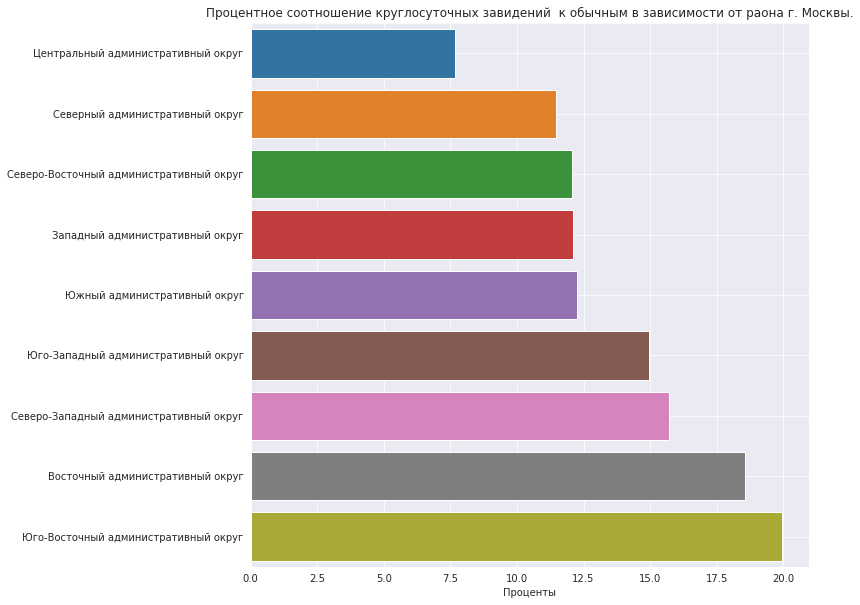

In [116]:
sns.set_style('dark')
plt.figure(figsize=(10,10))
sns.barplot(x='percent', y='district', data=df_time_normal.sort_values(by='percent'))
plt.title('Процентное соотношение круглосуточных завидений  к обычным в зависимости от раона г. Москвы.')
plt.xlabel('Проценты')
plt.ylabel(None)
plt.xticks(rotation=0)

plt.grid()
plt.show()

In [117]:
df_time_category=df.groupby(['category','is_24/7'], as_index = False)[['name']].count()

In [144]:
df_category_24=df_time_category.loc[df_time_category['is_24/7']==True]

In [145]:
df_category_24.columns=['category','is_24/7','count_24/7']

In [146]:
df_category_normal=df_time_category.loc[df_time_category['is_24/7']==False]
df_category_normal.columns=['category','is_24/7','count']

In [147]:
df_category_normal=df_category_normal.merge(df_category_24[['category','count_24/7']])
df_category_normal['percent']=(df_category_normal['count_24/7']/df_category_normal['count'])*100

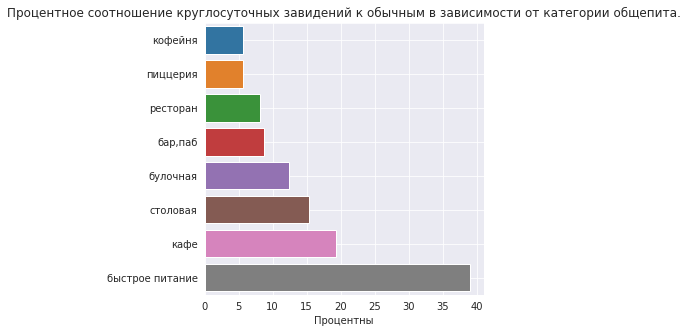

In [150]:
sns.set_style('dark')
plt.figure(figsize=(5,5))
sns.barplot(x='percent', y='category', data=df_category_normal.sort_values(by='percent'))
plt.title('Процентное соотношение круглосуточных завидений к обычным в зависимости от категории общепита.')
plt.xlabel('Процентны')
plt.ylabel(None)
plt.xticks(rotation=0)

plt.grid()
plt.show()

**Выводы:** Доля круглосуточных заведений от обычных зависит от района расположения и преобладает в спальных раинах г. Москвы а так же от категории точки общепита ( наибольший процент заведений работающих круглосуточно наблюдается с заведениях быстрого питания.

Рассчитаем медиальную цену кофе в заведениях г. Москвы по районам.

In [124]:
df_group_coffe = df.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')

In [125]:
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=df_group_coffe,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианная цена кофе в заведениях  г. Москвы по районам' ,
).add_to(m)
m

**Выводы:**  Кофе стоит дороже в  Центральном, Юго-Западном и западном административном округе.

Рассчитаем медиальную цену пива в заведениях г. Москвы по районам.

In [126]:
df_group_beer = df.groupby('district', as_index=False)['middle_glass_beer'].agg('median')

In [127]:
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=df_group_beer,
    columns=['district', 'middle_glass_beer'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианная цена пива в заведениях  г. Москвы по районам' ,
).add_to(m)
m

**Выводы:** Пиво в среднем стоит дороже Северо-Восточном, Центральный, Юго-Восточном и Западном административном округе.

In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8300 entries, 0 to 8405
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8300 non-null   object 
 1   category           8300 non-null   object 
 2   address            8300 non-null   object 
 3   district           8300 non-null   object 
 4   hours              7773 non-null   object 
 5   lat                8300 non-null   float64
 6   lng                8300 non-null   float64
 7   rating             8300 non-null   float64
 8   price              3981 non-null   object 
 9   avg_bill           3756 non-null   object 
 10  middle_avg_bill    3098 non-null   float64
 11  middle_coffee_cup  528 non-null    float64
 12  chain              8300 non-null   object 
 13  seats              4697 non-null   float64
 14  middle_glass_beer  128 non-null    float64
 15  street             8300 non-null   object 
 16  is_24/7            6582 

Рассмотрим зависимость рейтинга от медианного чека.

In [129]:
df_group = df.groupby('rating', as_index=False)['middle_avg_bill'].agg('median')

In [130]:
df_group=df_group.loc[df_group['rating']>3.5]

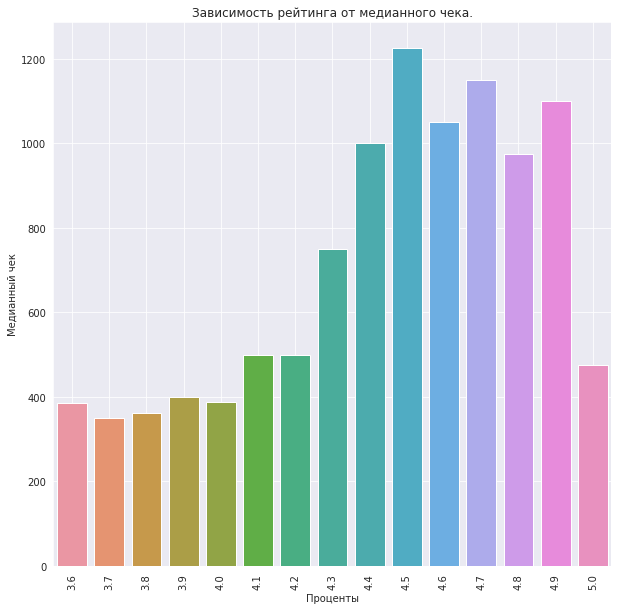

In [188]:
sns.set_style('dark')

plt.figure(figsize=(10,10))

sns.barplot(x='rating', y='middle_avg_bill', data=df_group)

plt.title('Зависимость рейтинга от медианного чека.')
plt.xlabel('Проценты')
plt.ylabel('Медианный чек')
plt.xticks(rotation=90)

plt.grid()
plt.show()

При удалении выбросов наблюдается устойчивое увеличение среднего чека с увеличение среднего рейтинга.

**Выводы:**
- К самым распространённым заведениям относятся заведения из категории кафе, ресторан, кофейне.
     менее распространённые заведения — это столовые, булочные.
- Наибольшие количество посадочных мест в заведения категории ресторан, кафе, кофейня, наименьшее столовые и булочные.
- Сетевые заведения составляют  38 процентов от всех заведение , не сетевых заведений значительно больше 62 процента от общего числа
- Распределения по категориям заведения показывает то, что в сетях и в обычных заведения самые распространёнными являются ресторан и кафе, но 3 место по количеству в сетях занимают кофейни так как в обычных заведениях это бары и пабы. В сетях не популярны пабы, а в обычных заведениях реже можно встретить пиццерии.
- Самыми популярными сетями являются Шоколадница, Доминос пицца, Додо пицца, one price coffee, Яндекс лавка. Можно так же сделать вывод что популярные сети заняли такие ниши как кофейни плюс пиццерии. Малому бизнесу будет очень сложно конкурировать в данных сегментах.
- Самый насыщенный заведениями район это центральный в нем преобладают рестораны, кафе, кофейни, бары и пабы. Данное распределение является нормальным. Остальные районы Москвы не сильно отличаются друг от руга по количеству заведений не считая трех явных аутсайдера Северо-западный, Юго-западный, Юго-восточный административный округ. Сети быстрого питания и пиццерии и кафе распределены равномерно по Москве(не считаная северо-западного административного округа) . Пабы, бары, рестораны, кофейни в основной свое части расположены в центральном административном округе.
- Пабы, бары и рестораны явно выделяются в сторону более высоких средних рейтингов в то время как сети быстрого питания на против демонстрируют более низкое распределения средних рейтингов.
- Наиболее популярные улицы в городе Москва по количеству заведений это
    - Проспект мира (больше распространение получили рестораны)
    - Профсоюзная улица (больше распространение получили Кафе)
    - Ленинский проспект (больше распространение получили Кафе)
    - В данной выборки выделяется Мкад наличием большого количества кафе.
- Найдено 457 улиц  на которых находится только один объект общепита. При выбори открытия новых точек необходимо использовать это список для поиска места.
- Западный административный округ и Центральный административный округ показывают наибольший результат. Полученный результат является ожидаемым так как центр всегда является более востребован в сфере общепита а западный район Г. Москвы считается более востребованным при выборе места жительства (Лучшая Экология) цена на еду в ресторанах подтверждает данный тренд. Медианный чек в  Южных и Северные районах г. Москвы является более дешёвым относительно  Западного и Центрального административного округа.
- Доля круглосуточных заведений от обычных зависит от района расположения и преобладает в спальных раинах г. Москвы а так же от категории точки общепита ( наибольший процент заведений работающих круглосуточно наблюдается с заведениях быстрого питания.
- Цена кофе значительно дороже в  Центральном, Юго-Западном и западном административном округе.
- Пиво в среднем стоит дороже Северо-Восточном, Центральный, Юго-Восточном и Западном административном округе.
- Наблюдается устойчивое увеличение цены среднего чека с увеличение среднего рейтинга. 



## Исследование: открытие кофейни

In [132]:
df_coffee=df.loc[df['category']=='кофейня']

In [133]:
df_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1396 entries, 3 to 8400
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1396 non-null   object 
 1   category           1396 non-null   object 
 2   address            1396 non-null   object 
 3   district           1396 non-null   object 
 4   hours              1381 non-null   object 
 5   lat                1396 non-null   float64
 6   lng                1396 non-null   float64
 7   rating             1396 non-null   float64
 8   price              746 non-null    object 
 9   avg_bill           709 non-null    object 
 10  middle_avg_bill    195 non-null    float64
 11  middle_coffee_cup  514 non-null    float64
 12  chain              1396 non-null   object 
 13  seats              734 non-null    float64
 14  middle_glass_beer  0 non-null      float64
 15  street             1396 non-null   object 
 16  is_24/7            1097 

**Выводы:** В городе Москва открыто 1396 кофейня.

In [134]:
df_coffee_group = df_coffee.groupby('district', as_index=False)['name'].agg('count')

In [136]:
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=df_coffee_group,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Расположение кофейнь по районам г. Москвы',
).add_to(m)
m

**Выводы:** Наибольшее количество кофейнь располагается в Центральном административном округе. В остальных районах Москвы  кофейнь меньше практически в 2 раза.

Посмотрим количество круглосуточных кафе

In [151]:
df_coffee_24=df_coffee.loc[df_coffee['is_24/7']==True]

In [191]:
df_coffee_group_24 = df_coffee_24.groupby('district', as_index=False)['name'].agg('count')

In [203]:
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=df_coffee_group_24,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Расположение круглосуточных кофейнь по районам г. Москвы',
).add_to(m)
m

In [156]:
(df_coffee_group_24['name']).sum()

58

**Выводы:** В городе 58 круглосуточных кофейнь 25 из них находится в Центральном административном округе и 9 в Западном административном округе.

In [163]:
df_group_coffe.columns=['district','coffee_cup_price']

**Выводы:** 
При открытии кафе необходимо придерживаться цены чашки кофе в зависимости от района г. Москвы 
- Восточный административный округ – 135 рублей за чашку кофе
- Западный административный округ -185 
- Северный административный округ - 159
- Северо-Восточный административный округ -162,5
- Северо-Западный административный округ -150
- Центральный административный округ -190
- Юго-Восточный административный округ -145
- Юго-Западный административный округ - 197
- Южный административный окру - 149.5


In [173]:
df_coffee_rating = df_coffee.groupby('district', as_index=False)['rating'].agg('median')

In [194]:
moscow_lat, moscow_lng = 55.751244, 37.618423
state_geo = '/datasets/admin_level_geomap.geojson'
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=df_coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Рейтинг кофейнь по районам г. Москвы',
).add_to(m)
m

**Выводы:** Рейтинг практически не зависит от расположения, кроме западного административного округа. (Причина большее количество сетевых заведений)

In [177]:
df_coffee_chain = df_coffee.groupby(['district','chain'], as_index=False)['name'].agg('count')

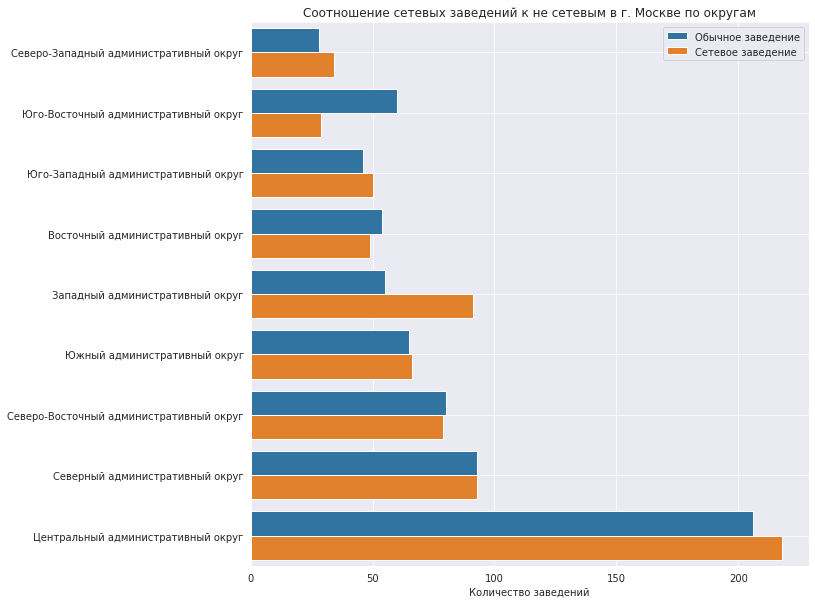

In [196]:
sns.set_style('dark')
plt.figure(figsize=(10,10))
sns.barplot(x='name', y='district', data=df_coffee_chain .sort_values(by='name'),hue='chain')
plt.title('Соотношение сетевых заведений к не сетевым в г. Москве по округам')
plt.xlabel('Количество заведений')
plt.ylabel(None)
plt.xticks(rotation=0)
plt.legend()
plt.grid()
plt.show()

**Выводы:** В преобладающей доли районов наблюдается паритет сетевых и не сетевых заведений за исключением. 
- *В Западного административного округа* гораздо больше сетевых заведений есть смысл открывать не сетевое заведение с уникальным брендингом.
- *Юго-Восточного административного округа*  наблюдается малое количество сетевых заведений. Основная причина малая медианная цена чашки кофе 145 рублей. 



In [195]:
coffee_chain_rating=df_coffee.groupby(['chain'], as_index=False)['rating'].agg('median')

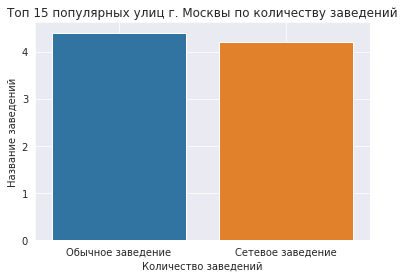

In [202]:
sns.set_style('dark')

sns.barplot(x='chain', y='rating', data=coffee_chain_rating )
plt.title('Топ 15 популярных улиц г. Москвы по количеству заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Название заведений')
plt.xticks(rotation=0)

plt.grid()
plt.show()

**Вывод:** Рейтинг в не сетевых кофейнях выше чем в сетевых 

Провели исследование по открытию кофейни. 
1. **Выводы:**
    - В городе Москва открыто 1396 кофейня.
    -  Наибольшее количество кофейнь располагается в Центральном административном округе. В остальных районах Москвы количество кофейни меньше практически в 2 раза.  
    - В городе 58 круглосуточных кофейнь 25 из них находится в Центральном административном округе и 9 в Западном административном округе.
    - При открытии кафе необходимо придерживаться цены чашки кофе в зависимости от района г. Москвы 
        - Восточный административный округ – 135 рублей за чашку кофе
        - Западный административный округ -185 
        - Северный административный округ - 159
        - Северо-Восточный административный округ -162,5
        - Северо-Западный административный округ -150
        - Центральный административный округ -190
        - Юго-Восточный административный округ -145
        - Юго-Западный административный округ - 197
        - Южный административный окру - 149.5
    - Рейтинг практически не зависит от расположения, кроме западного административного округа. (Причина большее количество сетевых заведений)
    - В преобладающей доли районов наблюдается паритет сетевых и не сетевых заведений за исключением. 
        - *В Западного административного округа* гораздо больше сетевых заведений есть смысл открывать не сетевое заведение с уникальным брендингом.
        - *Юго-Восточного административного округа*  наблюдается малое количество сетевых заведений. Основная причина малая медианная цена чашки кофе 145 рублей.
    - Рейтинг в не сетевых кофейнях выше чем в сетевых

2. **Рекомендации.**

    - Перспективный округ для открытия новой кофейни по медианной цене чашки кофе.
- Юго-Западный административный округ
        - Западный административный округ 
    - Стартовая цена за медианную кружку кофе должна составлять  
        - Юго-Западный административный округ – 175
        - Западный административный округ  -165
    - Тип заведения лучше выбрать
        - Западный административный округ  - не сетевое
        - Юго-Западный административный округ сетевое либо не сетевое. 
    - График работы .
        - Западный административный округ  7/24
        - Юго-Западный административный округ 7/24 либо  7/ рабочий день.
